In [ ]:
import numpy as np
from PIL import Image
from IPython.display import display
import pickle
import os

#obtain list of test images in order
test_name = 'trainfull'
test_files = []
with open('/home/ubuntu/try1/data/ImageSets/'+test_name+'.txt') as f:
    num_lines = 0
    for file_ in f.readlines():
        num_lines += 1
        test_files.append(file_.strip())
#print test_files
print num_lines

image_path = '/home/ubuntu/try1/data/Images/'
classes = ['__background__', 'rbc', 'tro', 'sch', 'ring', 'gam', 'leu']
THRESHOLD = 0.5
path = '/home/ubuntu/try1/results/'+test_name

#for each test image, for each class get the bounding box coordinates of the objects with probability >= THRESHOLD
#for each filtered detection, draw a colored box 
file_limit = 5
for file_index, file_ in enumerate(test_files):
    print file_
    #get numpy array of image 
    try:
        extension='.tif'
        pil_im = np.asarray(Image.open(os.path.join(image_path, file_+extension)))
    except: 
        extension='.jpg' 
        pil_im = np.asarray(Image.open(os.path.join(image_path, file_+extension)))

             
    pil_im = pil_im.copy()
    
    for cls in range(1,len(classes)):
        num_lines_class = 0
        num_lines_class_file = 0
        filtered_boxes=[]
        
        #open nms detection file
        filename = '4360_det_'+test_name+'_'+classes[cls]+'.txt'
        with open(os.path.join(path, filename), 'r') as f:
            for line in f.readlines():
                num_lines_class += 1
                
                line_list = line.split()
                #if file name matches
                if line_list[0].lower() == file_.lower():
                    num_lines_class_file +=1
                    #if the detection has probability above the threshold
                    if float(line_list[1]) >= THRESHOLD:
                        print line_list
                        filtered_boxes.append([float(i) for i in line_list[2:]])
        #print 'num lines class', num_lines_class, classes[cls]
        #print 'num lines class file', num_lines_class_file
    
        
        for box in filtered_boxes:
            box = [int(box[ii]) for ii in range(len(box))]
            if cls ==1: #black
                for i in range(box[0], box[2]):
                    pil_im[box[1],i, :] = 0
                    pil_im[box[3],i, :] = 0
                for j in range(box[1], box[3]):
                    pil_im[j,box[0], :] = 0
                    pil_im[j,box[2], :] = 0
            elif cls ==2: #red
                for i in range(box[0], box[2]):
                    pil_im[box[1],i, 0] = 255
                    pil_im[box[3],i, 0] = 255
                for j in range(box[1], box[3]):
                    pil_im[j,box[0], 0] = 255
                    pil_im[j,box[2], 0] = 255
            elif cls ==3:
                for i in range(box[0], box[2]):
                    pil_im[box[1],i, 1] = 255
                    pil_im[box[3],i, 1] = 255
                for j in range(box[1], box[3]):
                    pil_im[j,box[0], 1] = 255
                    pil_im[j,box[2], 1] = 255
            elif cls ==4:
                for i in range(box[0], box[2]):
                    pil_im[box[1],i, 2] = 255
                    pil_im[box[3], i,2] = 255
                for j in range(box[1], box[3]):
                    pil_im[j,box[0], 2] = 255
                    pil_im[j,box[2],  2] = 255
            elif cls ==5:
                for i in range(box[0], box[2]):
                    pil_im[box[1],i, 1] = 0
                    pil_im[box[3],i, 1] = 0
                    pil_im[box[1],i, 2] = 0
                    pil_im[box[3],i, 2] = 0
                for j in range(box[1], box[3]):
                    pil_im[j,box[0], 1] = 0
                    pil_im[j,box[2], 1] = 0
                    pil_im[j,box[0], 2] = 0
                    pil_im[j,box[2], 2] = 0
            elif cls ==6:
                for i in range(box[0], box[2]):
                    pil_im[box[1],i, 0] = 255
                    pil_im[box[3],i, 0] = 255
                    pil_im[box[1],i, 2] = 255
                    pil_im[box[3],i, 2] = 255
                for j in range(box[1], box[3]):
                    pil_im[j,box[0], 0] = 255
                    pil_im[j,box[2], 0] = 255
                    pil_im[j,box[0], 2] = 255
                    pil_im[j,box[2], 2] = 255
        
    
    display(Image.fromarray(pil_im,'RGB'))
    if file_index >= file_limit:
        break

247
g8_t1_up/g6010229
['g8_t1_up/g6010229', '1.000', '289.0', '80.8', '405.5', '207.7']
['g8_t1_up/g6010229', '1.000', '797.4', '58.1', '909.8', '170.3']
['g8_t1_up/g6010229', '1.000', '1024.1', '308.3', '1133.8', '407.5']
['g8_t1_up/g6010229', '1.000', '1118.7', '816.1', '1235.9', '931.4']
['g8_t1_up/g6010229', '1.000', '1366.9', '62.1', '1479.9', '169.2']
['g8_t1_up/g6010229', '1.000', '1235.8', '197.4', '1341.9', '307.2']
['g8_t1_up/g6010229', '1.000', '135.2', '646.7', '241.8', '764.2']
['g8_t1_up/g6010229', '1.000', '247.5', '411.2', '348.9', '502.9']
['g8_t1_up/g6010229', '1.000', '1288.1', '544.8', '1389.1', '664.8']
['g8_t1_up/g6010229', '1.000', '1226.3', '812.1', '1324.4', '931.4']
['g8_t1_up/g6010229', '1.000', '394.1', '326.9', '500.4', '431.0']
['g8_t1_up/g6010229', '1.000', '755.5', '289.2', '850.9', '374.5']
['g8_t1_up/g6010229', '1.000', '886.8', '500.1', '985.9', '592.8']
['g8_t1_up/g6010229', '1.000', '1367.2', '752.9', '1464.8', '851.3']
['g8_t1_up/g6010229', '1.000'

In [7]:
#get results
import pickle
import os
DET = 2711
THRESH = 0.5
classes = ['__background__', 'rbc', 'tro', 'sch', 'ring', 'gam', 'leu']
base_dir = '/home/ubuntu/py-faster-rcnn/output/faster_rcnn_end2end/test/'
base_dir += 'vgg_cnn_m_1024_faster_rcnn_iter_100000'
for cls in classes[1:]:
    f = pickle.load(open(os.path.join(base_dir, str(DET)+'_det_'+cls+'_r_p_ap.pkl')))
    #print [idx for idx, value in enumerate(f['thresh']) if value<THRESH]
    try: 
        index = next(idx for idx, value in enumerate(f['thresh']) if value<THRESH)
    except:
        index = len(f['thresh']) - 1

    print cls#, index
    print 'sensitivity', f['rec'][index]
    print 'specificity', f['spec'][index]
    print 'precision', f['prec'][index]
    print 'accuracy', (f['tp'][index]+f['tn'][index])*1.0/(f['tp'][index]+f['tn'][index]+f['fn'][index]+f['fp'][index])

rbc
sensitivity 0.968660968661
specificity 0.998038666293
precision 0.98981077147
accuracy 0.993210021072
tro
sensitivity 0.989795918367
specificity 0.996964416212
precision 0.64238410596
accuracy 0.996925141164
sch
sensitivity 0.0
specificity 0.999943658798
precision 0.0
accuracy 0.999605744861
ring
sensitivity 0.8
specificity 0.999438895747
precision 0.444444444444
accuracy 0.99932705249
gam
sensitivity 0.611111111111
specificity 0.999943598421
precision 0.916666666667
accuracy 0.999549244985
leu
sensitivity 1.0
specificity 0.999887747657
precision 0.777777777778
accuracy 0.999887791741


g8_t1_up/g6010021_4
g8_t1_up/g6010021_4.txt
['259', '262', '386', '357', 'rbc', 'False']
['14', '99', '101', '193', 'rbc', 'False']
['315', '112', '414', '207', 'rbc', 'False']
['116', '37', '208', '124', 'rbc', 'False']


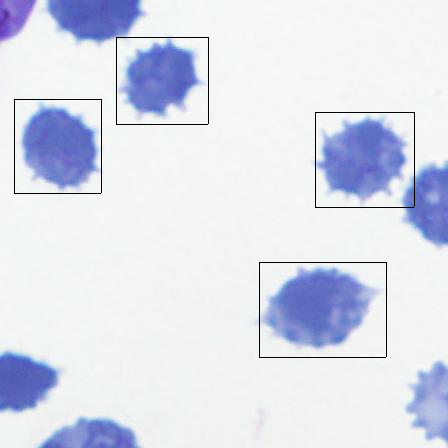

g8_t1_up/g6010021_5
g8_t1_up/g6010021_5.txt
['289', '206', '416', '301', 'rbc', 'False']
['44', '43', '131', '137', 'rbc', 'False']
['345', '56', '444', '151', 'rbc', 'False']


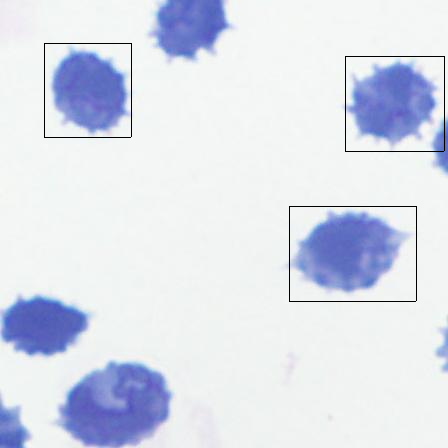

g8_t1_up/g6010021_6
g8_t1_up/g6010021_6.txt
['331', '17', '428', '114', 'rbc', 'False']
['298', '162', '385', '256', 'rbc', 'False']


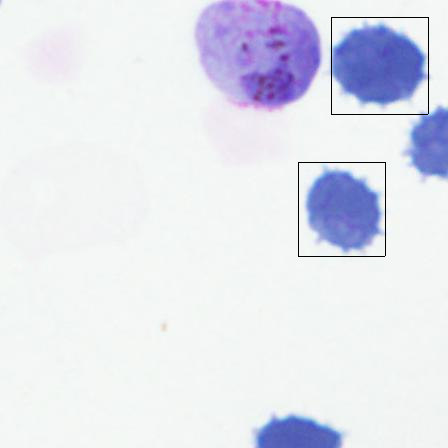

g8_t1_up/g6010021_8
g8_t1_up/g6010021_8.txt
['152', '175', '239', '275', 'rbc', 'False']
['96', '50', '209', '170', 'tro', 'False']
['49', '242', '160', '344', 'rbc', 'False']


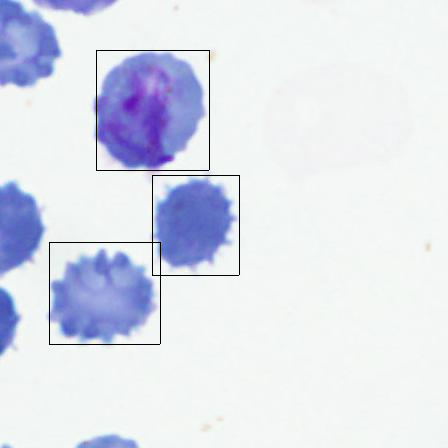

g8_t1_up/g6010021_10
g8_t1_up/g6010021_10.txt
['72', '302', '203', '416', 'tro', 'False']
['211', '324', '308', '421', 'rbc', 'False']


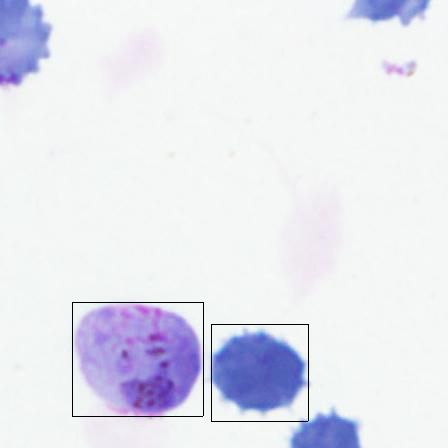

g8_t1_up/g6010021_31
g8_t1_up/g6010021_31.txt
['227', '226', '314', '326', 'rbc', 'False']
['171', '101', '284', '221', 'tro', 'False']
['124', '293', '235', '395', 'rbc', 'False']
['43', '52', '133', '139', 'rbc', 'False']
['35', '227', '120', '327', 'rbc', 'False']
['6', '329', '93', '407', 'rbc', 'False']


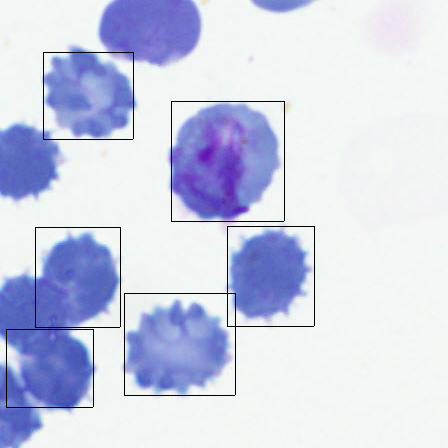

g8_t1_up/g6010021_36
g8_t1_up/g6010021_36.txt
['44', '131', '175', '245', 'tro', 'False']
['183', '153', '280', '250', 'rbc', 'False']
['150', '298', '237', '392', 'rbc', 'False']
['252', '236', '344', '323', 'rbc', 'False']


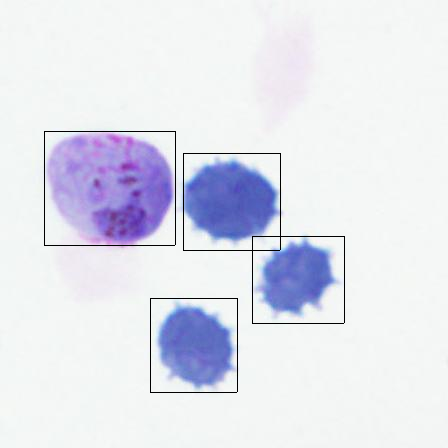

g8_t1_up/g6010021_53
g8_t1_up/g6010021_53.txt
['301', '175', '432', '289', 'tro', 'False']
['0', '116', '122', '232', 'rbc', 'False']


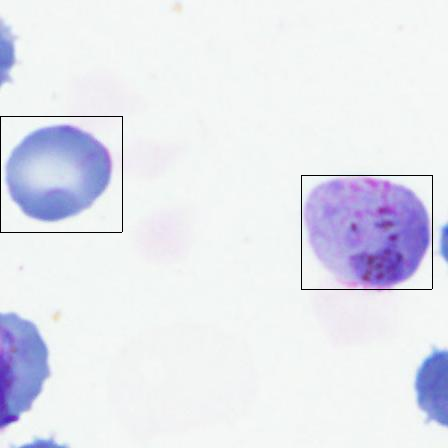

g8_t1_up/g6010021_58
g8_t1_up/g6010021_58.txt
['21', '154', '129', '239', 'rbc', 'False']
['93', '268', '206', '388', 'tro', 'False']
['152', '74', '274', '190', 'rbc', 'False']
['22', '39', '143', '150', 'tro', 'False']


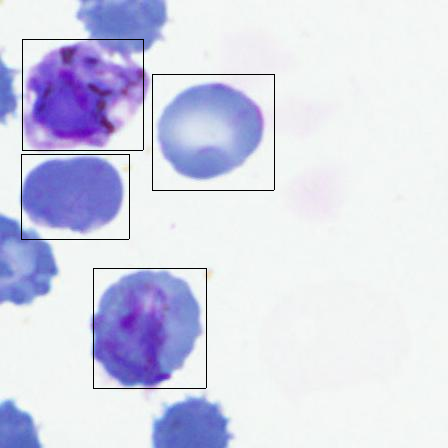

g8_t1_up/g6010021_68
g8_t1_up/g6010021_68.txt
['68', '289', '176', '374', 'rbc', 'False']
['120', '91', '220', '195', 'rbc', 'False']
['199', '209', '321', '325', 'rbc', 'False']
['69', '174', '190', '285', 'tro', 'False']
['12', '354', '102', '441', 'rbc', 'False']


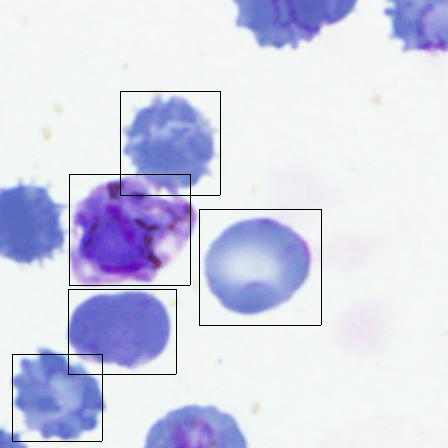

g8_t1_up/g6010021_69
g8_t1_up/g6010021_69.txt
['137', '239', '245', '324', 'rbc', 'False']
['46', '128', '141', '225', 'rbc', 'False']
['189', '41', '289', '145', 'rbc', 'False']
['268', '159', '390', '275', 'rbc', 'False']
['138', '124', '259', '235', 'tro', 'False']
['81', '304', '171', '391', 'rbc', 'False']


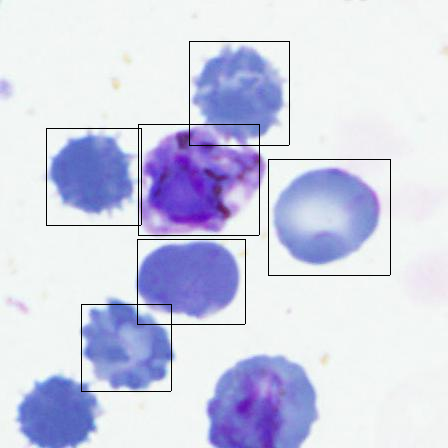

g8_t1_up/g6010021_80
g8_t1_up/g6010021_80.txt
['59', '248', '146', '348', 'rbc', 'False']
['3', '123', '116', '243', 'tro', 'False']


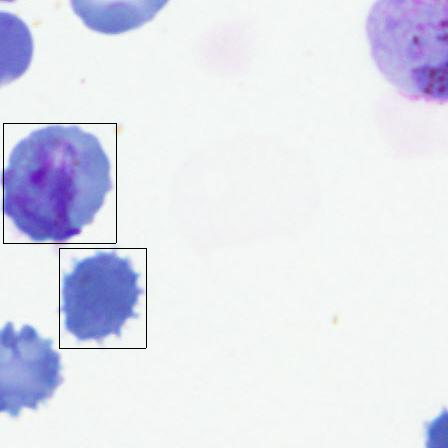

g8_t1_up/g6010021_83
g8_t1_up/g6010021_83.txt
['175', '129', '306', '243', 'tro', 'False']
['314', '151', '411', '248', 'rbc', 'False']
['281', '296', '368', '390', 'rbc', 'False']


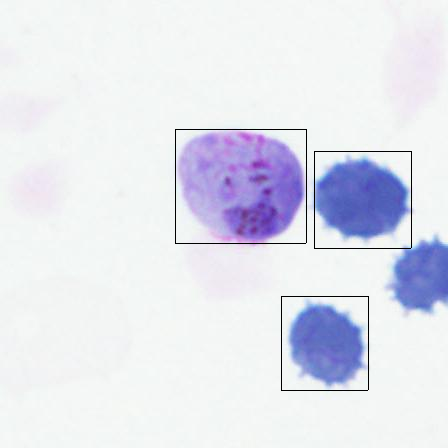

g8_t1_up/g6010021_84
g8_t1_up/g6010021_84.txt
['165', '177', '273', '262', 'rbc', 'False']
['237', '291', '350', '411', 'tro', 'False']
['74', '66', '169', '163', 'rbc', 'False']
['296', '97', '418', '213', 'rbc', 'False']
['43', '308', '137', '399', 'rbc', 'False']
['166', '62', '287', '173', 'tro', 'False']
['109', '242', '199', '329', 'rbc', 'False']


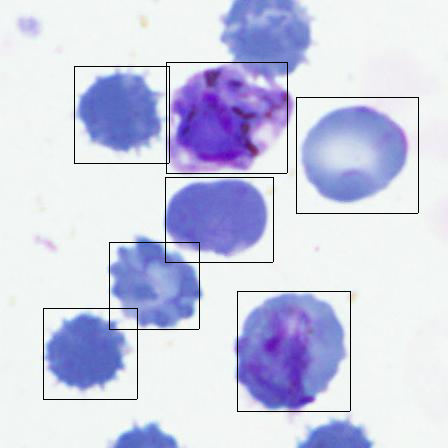

g8_t1_up/g6010021_86
g8_t1_up/g6010021_86.txt
['262', '196', '393', '310', 'tro', 'False']


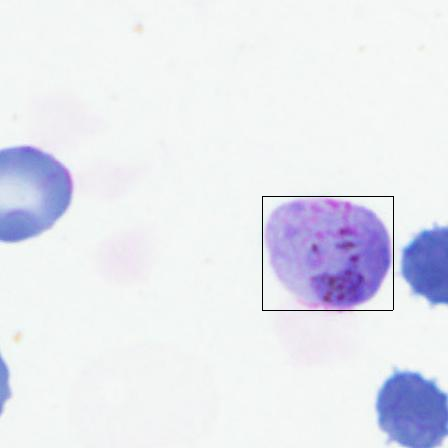

g8_t1_up/g6010021_90
g8_t1_up/g6010021_90.txt
['114', '39', '245', '153', 'tro', 'False']
['253', '61', '350', '158', 'rbc', 'False']
['220', '206', '307', '300', 'rbc', 'False']
['322', '144', '414', '231', 'rbc', 'False']


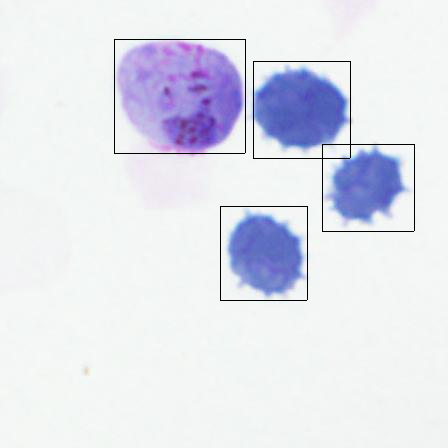

g8_t1_up/g6010021_92
g8_t1_up/g6010021_92.txt
['124', '59', '232', '144', 'rbc', 'False']
['252', '298', '339', '398', 'rbc', 'False']
['196', '173', '309', '293', 'tro', 'False']
['2', '190', '96', '281', 'rbc', 'False']
['68', '124', '158', '211', 'rbc', 'False']
['60', '299', '145', '399', 'rbc', 'False']
['7', '340', '104', '430', 'rbc', 'False']


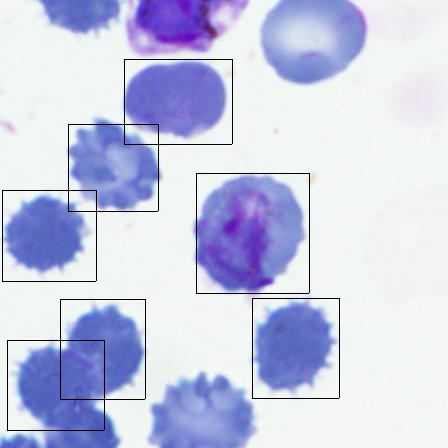

g8_t1_up/g6010021_97
g8_t1_up/g6010021_97.txt
['148', '314', '256', '399', 'rbc', 'False']
['57', '203', '152', '300', 'rbc', 'False']
['200', '116', '300', '220', 'rbc', 'False']
['279', '234', '401', '350', 'rbc', 'False']
['149', '199', '270', '310', 'tro', 'False']


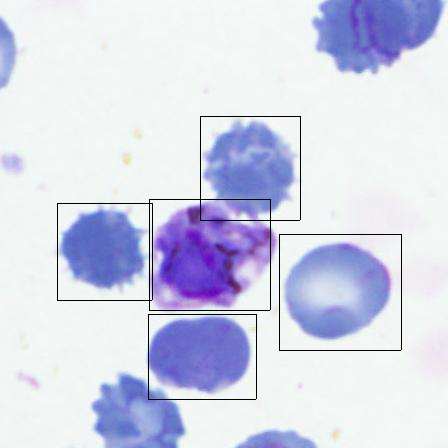

g8_t1_up/g6010021_101
g8_t1_up/g6010021_101.txt
['88', '108', '219', '222', 'tro', 'False']
['227', '130', '324', '227', 'rbc', 'False']
['194', '275', '281', '369', 'rbc', 'False']
['296', '213', '388', '300', 'rbc', 'False']


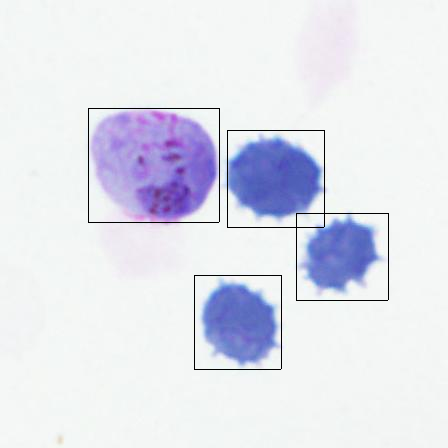

g8_t1_up/g6010021_104
g8_t1_up/g6010021_104.txt
['77', '213', '185', '298', 'rbc', 'False']
['149', '327', '262', '447', 'tro', 'False']
['129', '15', '229', '119', 'rbc', 'False']
['208', '133', '330', '249', 'rbc', 'False']
['78', '98', '199', '209', 'tro', 'False']
['21', '278', '111', '365', 'rbc', 'False']


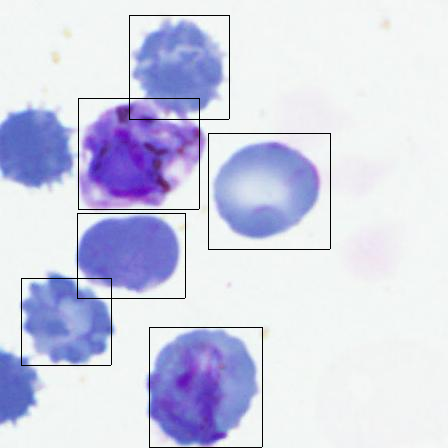

g8_t1_up/g6010021_110
g8_t1_up/g6010021_110.txt
['79', '301', '210', '415', 'tro', 'False']
['218', '323', '315', '420', 'rbc', 'False']


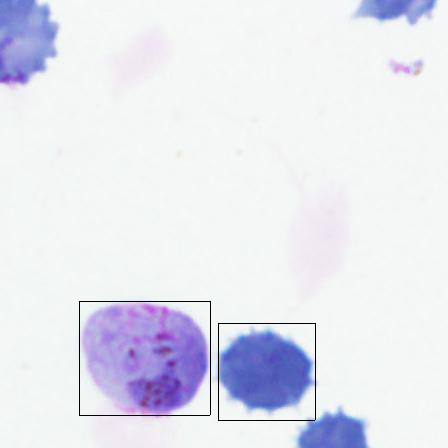

g8_t1_up/g6010021_113
g8_t1_up/g6010021_113.txt
['288', '251', '419', '365', 'tro', 'False']


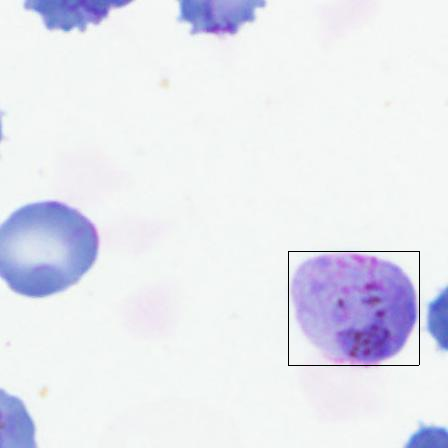

g8_t1_up/g6010021_117
g8_t1_up/g6010021_117.txt
['293', '171', '424', '285', 'tro', 'False']


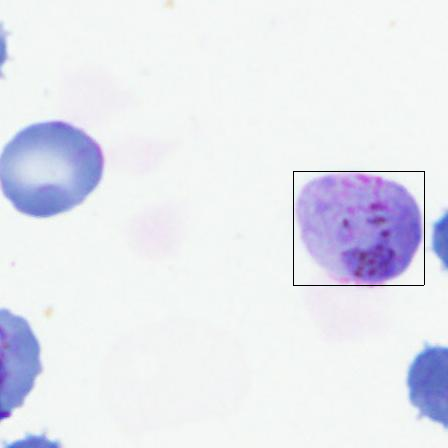

g8_t1_up/g6010021_118
g8_t1_up/g6010021_118.txt
['99', '119', '230', '233', 'tro', 'False']
['238', '141', '335', '238', 'rbc', 'False']
['205', '286', '292', '380', 'rbc', 'False']
['307', '224', '399', '311', 'rbc', 'False']


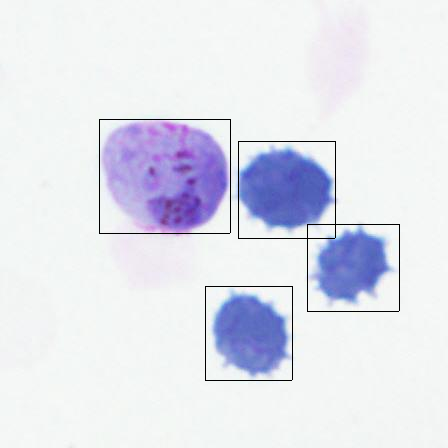

g8_t1_up/g6010021_119
g8_t1_up/g6010021_119.txt
['195', '239', '326', '353', 'tro', 'False']
['334', '261', '431', '358', 'rbc', 'False']


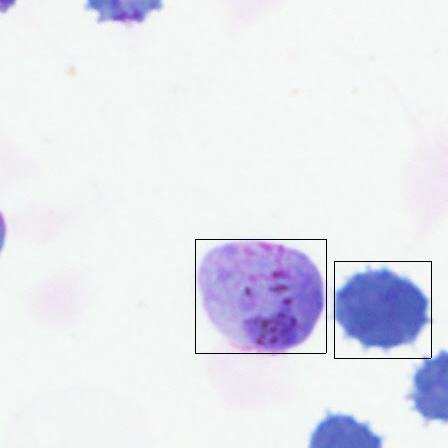

g8_t1_up/g6010021_128
g8_t1_up/g6010021_128.txt
['67', '45', '198', '159', 'tro', 'False']
['206', '67', '303', '164', 'rbc', 'False']
['173', '212', '260', '306', 'rbc', 'False']
['275', '150', '367', '237', 'rbc', 'False']


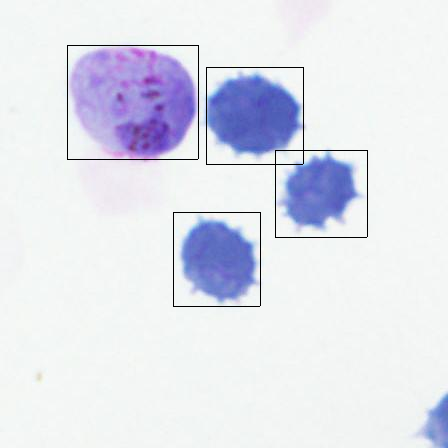

g8_t1_up/g6010021_131
g8_t1_up/g6010021_131.txt
['123', '278', '254', '392', 'tro', 'False']
['262', '300', '359', '397', 'rbc', 'False']


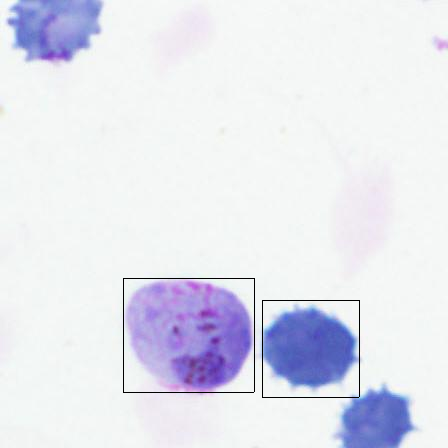

g8_t1_up/g6010021_132
g8_t1_up/g6010021_132.txt
['23', '269', '117', '372', 'rbc', 'False']
['296', '138', '383', '238', 'rbc', 'False']
['240', '13', '353', '133', 'tro', 'False']
['193', '205', '304', '307', 'rbc', 'False']
['46', '30', '140', '121', 'rbc', 'False']
['104', '139', '189', '239', 'rbc', 'False']
['75', '241', '162', '319', 'rbc', 'False']
['51', '180', '148', '270', 'rbc', 'False']


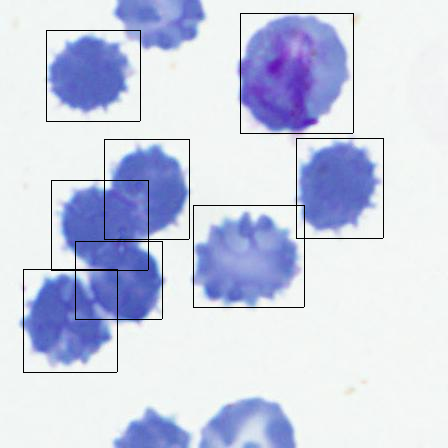

g8_t1_up/g6010021_136
g8_t1_up/g6010021_136.txt
['215', '207', '346', '321', 'tro', 'False']


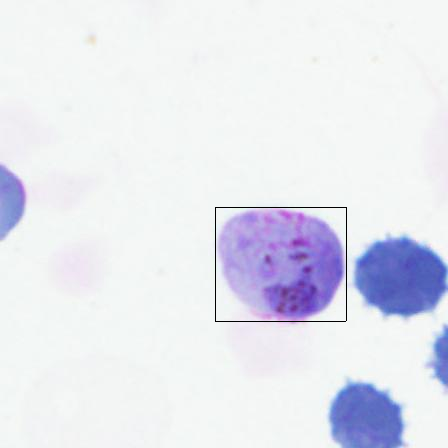

g8_t1_up/g6010021_139
g8_t1_up/g6010021_139.txt
['17', '25', '148', '139', 'tro', 'False']
['156', '47', '253', '144', 'rbc', 'False']
['123', '192', '210', '286', 'rbc', 'False']
['225', '130', '317', '217', 'rbc', 'False']


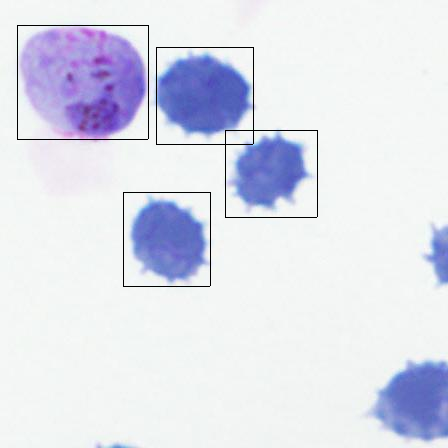

g8_t1_up/g6010021_141
g8_t1_up/g6010021_141.txt
['92', '226', '223', '340', 'tro', 'False']
['231', '248', '328', '345', 'rbc', 'False']
['300', '331', '392', '418', 'rbc', 'False']


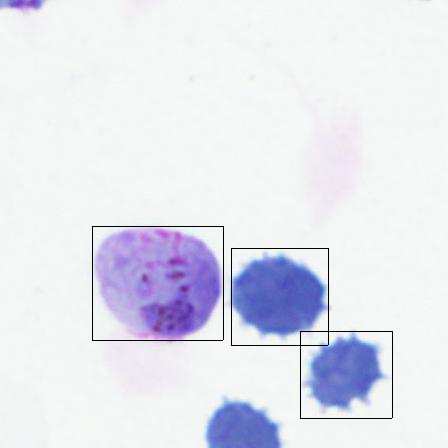

g8_t1_up/g6010021_142
g8_t1_up/g6010021_142.txt
['68', '5', '176', '90', 'rbc', 'False']
['196', '244', '283', '344', 'rbc', 'False']
['140', '119', '253', '239', 'tro', 'False']
['93', '311', '204', '413', 'rbc', 'False']
['12', '70', '102', '157', 'rbc', 'False']
['4', '245', '89', '345', 'rbc', 'False']


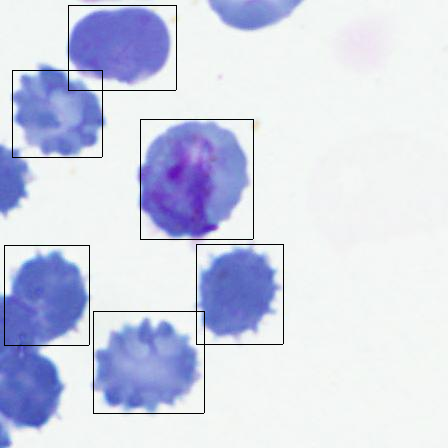

g8_t1_up/g6010021_148
g8_t1_up/g6010021_148.txt
['135', '176', '222', '276', 'rbc', 'False']
['79', '51', '192', '171', 'tro', 'False']
['32', '243', '143', '345', 'rbc', 'False']


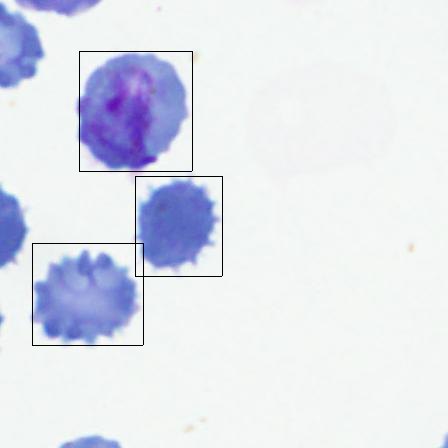

g8_t1_up/g6010021_150
g8_t1_up/g6010021_150.txt
['220', '242', '351', '356', 'tro', 'False']


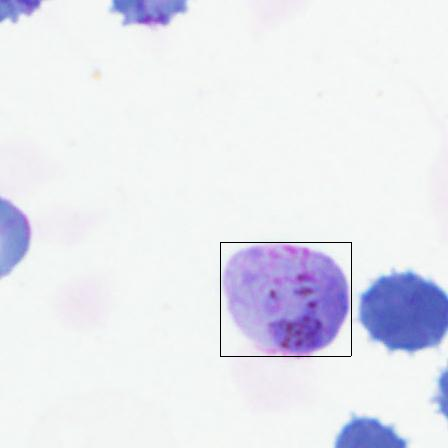

g8_t1_up/g6010021_151
g8_t1_up/g6010021_151.txt
['38', '325', '146', '410', 'rbc', 'False']
['90', '127', '190', '231', 'rbc', 'False']
['169', '245', '291', '361', 'rbc', 'False']
['39', '210', '160', '321', 'tro', 'False']
['199', '0', '300', '88', 'rbc', 'False']


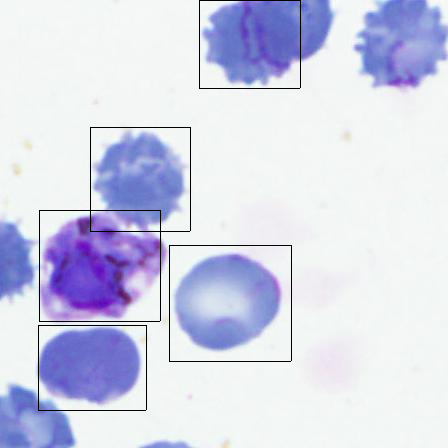

g8_t1_up/g6010021_153
g8_t1_up/g6010021_153.txt
['283', '8', '414', '122', 'tro', 'False']


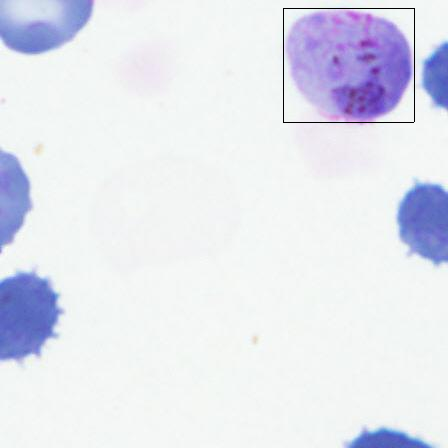

g8_t1_up/g6010021_161
g8_t1_up/g6010021_161.txt
['80', '262', '188', '347', 'rbc', 'False']
['132', '64', '232', '168', 'rbc', 'False']
['211', '182', '333', '298', 'rbc', 'False']
['81', '147', '202', '258', 'tro', 'False']
['24', '327', '114', '414', 'rbc', 'False']


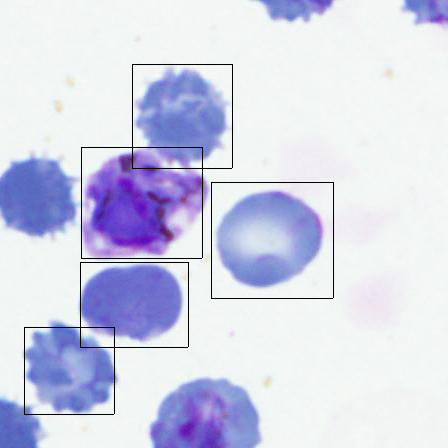

g8_t1_up/g6010021_169
g8_t1_up/g6010021_169.txt
['134', '157', '221', '257', 'rbc', 'False']
['78', '32', '191', '152', 'tro', 'False']
['31', '224', '142', '326', 'rbc', 'False']


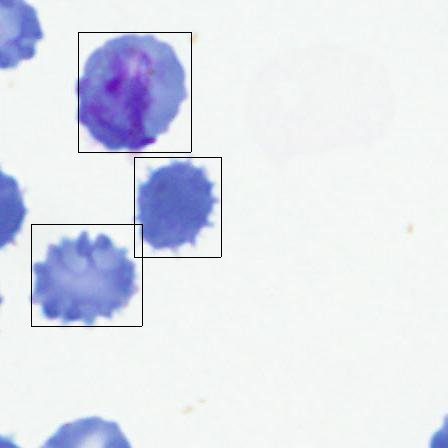

g8_t1_up/g6010021_172
g8_t1_up/g6010021_172.txt
['58', '270', '166', '355', 'rbc', 'False']
['110', '72', '210', '176', 'rbc', 'False']
['189', '190', '311', '306', 'rbc', 'False']
['59', '155', '180', '266', 'tro', 'False']
['2', '335', '92', '422', 'rbc', 'False']


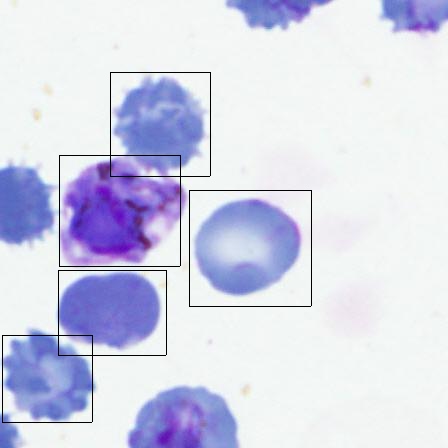

g8_t1_up/g6010021_184
g8_t1_up/g6010021_184.txt
['172', '178', '280', '263', 'rbc', 'False']
['244', '292', '357', '412', 'tro', 'False']
['81', '67', '176', '164', 'rbc', 'False']
['303', '98', '425', '214', 'rbc', 'False']
['50', '309', '144', '400', 'rbc', 'False']
['173', '63', '294', '174', 'tro', 'False']
['116', '243', '206', '330', 'rbc', 'False']


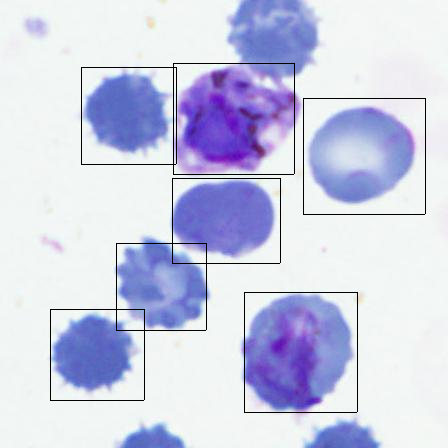

g8_t1_up/g6010021_185
g8_t1_up/g6010021_185.txt
['109', '8', '240', '122', 'tro', 'False']
['248', '30', '345', '127', 'rbc', 'False']
['215', '175', '302', '269', 'rbc', 'False']
['317', '113', '409', '200', 'rbc', 'False']


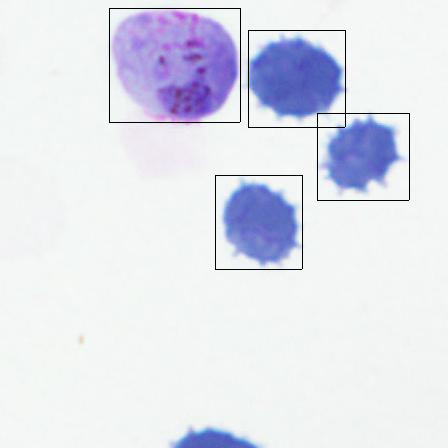

g8_t1_up/g6010021_186
g8_t1_up/g6010021_186.txt
['60', '239', '147', '339', 'rbc', 'False']
['4', '114', '117', '234', 'tro', 'False']


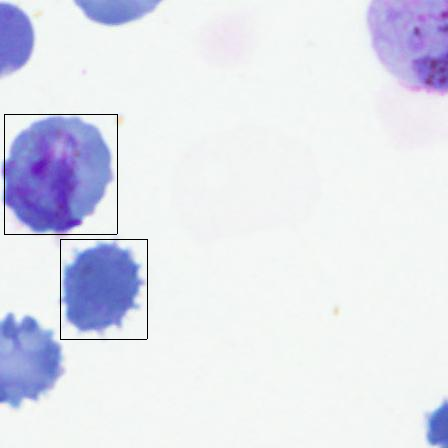

g8_t1_up/g6010021_194
g8_t1_up/g6010021_194.txt
['171', '235', '302', '349', 'tro', 'False']
['310', '257', '407', '354', 'rbc', 'False']


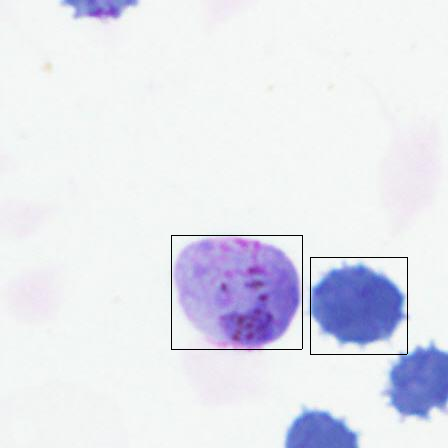

g8_t1_up/g6010021_195
g8_t1_up/g6010021_195.txt
['74', '274', '182', '359', 'rbc', 'False']
['126', '76', '226', '180', 'rbc', 'False']
['205', '194', '327', '310', 'rbc', 'False']
['75', '159', '196', '270', 'tro', 'False']
['18', '339', '108', '426', 'rbc', 'False']


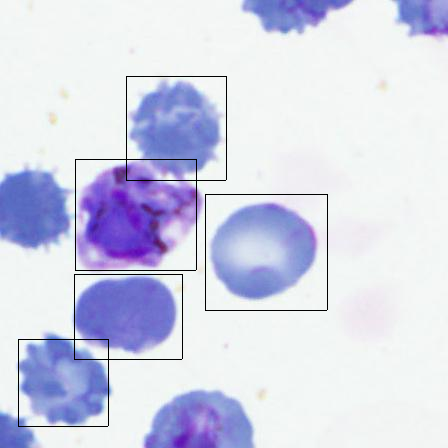

g8_t1_up/g6010021_200
g8_t1_up/g6010021_200.txt
['145', '279', '276', '393', 'tro', 'False']
['284', '301', '381', '398', 'rbc', 'False']


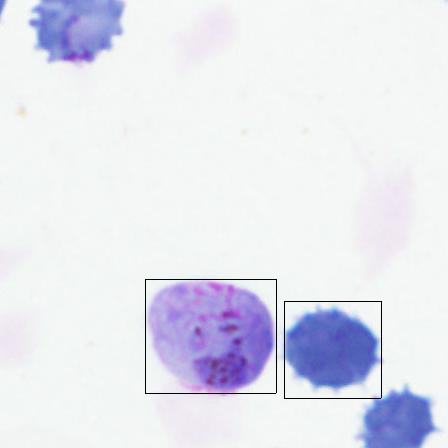

g8_t1_up/g6010021_205
g8_t1_up/g6010021_205.txt
['127', '177', '258', '291', 'tro', 'False']
['266', '199', '363', '296', 'rbc', 'False']
['233', '344', '320', '438', 'rbc', 'False']
['335', '282', '427', '369', 'rbc', 'False']


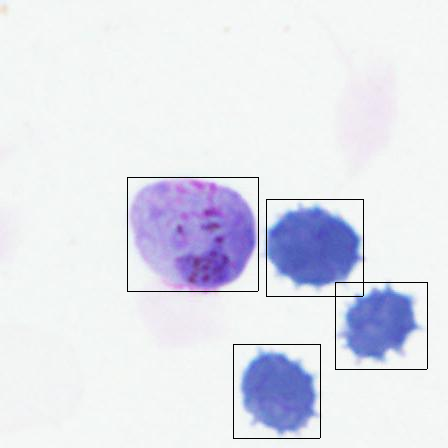

g8_t1_up/g6010021_212
g8_t1_up/g6010021_212.txt
['46', '229', '159', '349', 'tro', 'False']
['105', '35', '227', '151', 'rbc', 'False']


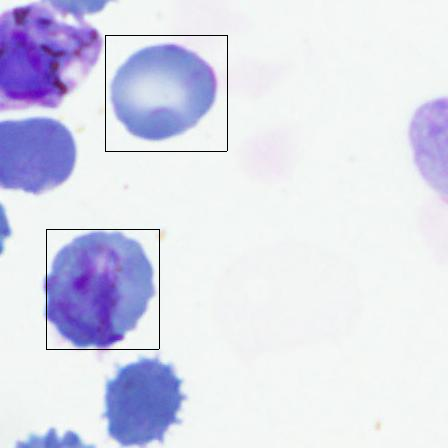

g8_t1_up/g6010021_215
g8_t1_up/g6010021_215.txt
['72', '241', '180', '326', 'rbc', 'False']
['124', '43', '224', '147', 'rbc', 'False']
['203', '161', '325', '277', 'rbc', 'False']
['73', '126', '194', '237', 'tro', 'False']
['16', '306', '106', '393', 'rbc', 'False']


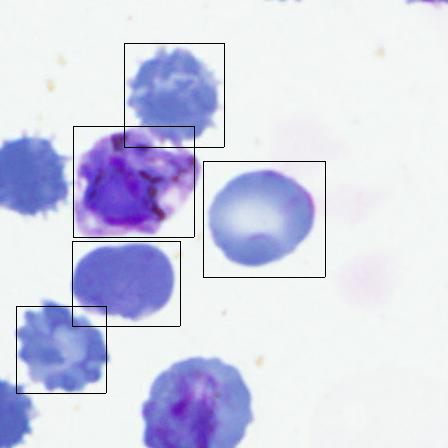

g8_t1_up/g6010021_218
g8_t1_up/g6010021_218.txt
['12', '182', '143', '296', 'tro', 'False']
['151', '204', '248', '301', 'rbc', 'False']
['118', '349', '205', '443', 'rbc', 'False']
['220', '287', '312', '374', 'rbc', 'False']


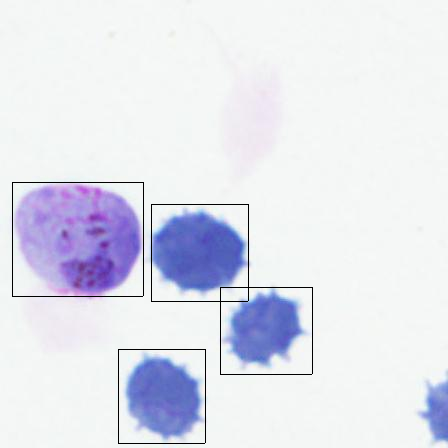

g8_t1_up/g6010021_219
g8_t1_up/g6010021_219.txt
['173', '273', '281', '358', 'rbc', 'False']
['82', '162', '177', '259', 'rbc', 'False']
['225', '75', '325', '179', 'rbc', 'False']
['304', '193', '426', '309', 'rbc', 'False']
['174', '158', '295', '269', 'tro', 'False']
['117', '338', '207', '425', 'rbc', 'False']


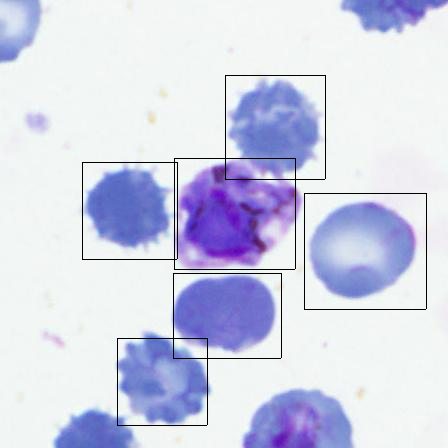

g8_t1_up/g6010021_220
g8_t1_up/g6010021_220.txt
['49', '201', '180', '315', 'tro', 'False']
['188', '223', '285', '320', 'rbc', 'False']
['257', '306', '349', '393', 'rbc', 'False']


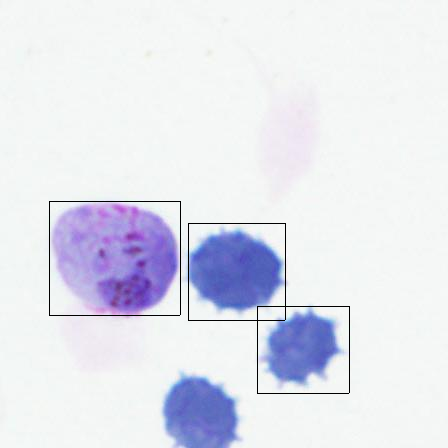

g8_t1_up/g6010021_222
g8_t1_up/g6010021_222.txt
['134', '293', '242', '378', 'rbc', 'False']
['43', '182', '138', '279', 'rbc', 'False']
['186', '95', '286', '199', 'rbc', 'False']
['265', '213', '387', '329', 'rbc', 'False']
['135', '178', '256', '289', 'tro', 'False']
['78', '358', '168', '445', 'rbc', 'False']


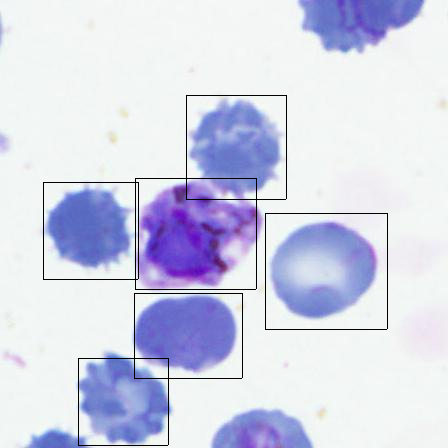

g8_t1_up/g6010021_227
g8_t1_up/g6010021_227.txt
['133', '300', '241', '385', 'rbc', 'False']
['42', '189', '137', '286', 'rbc', 'False']
['185', '102', '285', '206', 'rbc', 'False']
['264', '220', '386', '336', 'rbc', 'False']
['134', '185', '255', '296', 'tro', 'False']


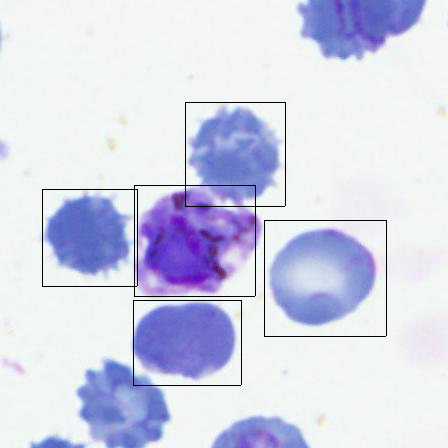

g8_t1_up/g6010021_229
g8_t1_up/g6010021_229.txt
['246', '293', '377', '407', 'tro', 'False']


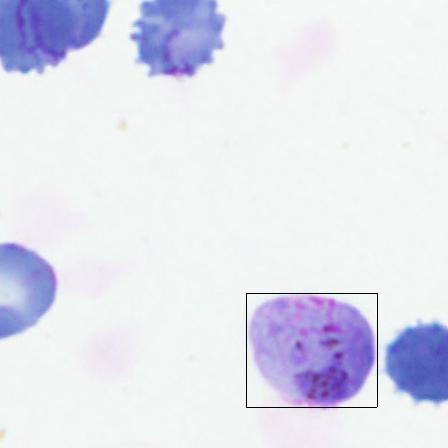

g8_t1_up/g6010021_231
g8_t1_up/g6010021_231.txt
['123', '136', '210', '236', 'rbc', 'False']
['67', '11', '180', '131', 'tro', 'False']
['20', '203', '131', '305', 'rbc', 'False']


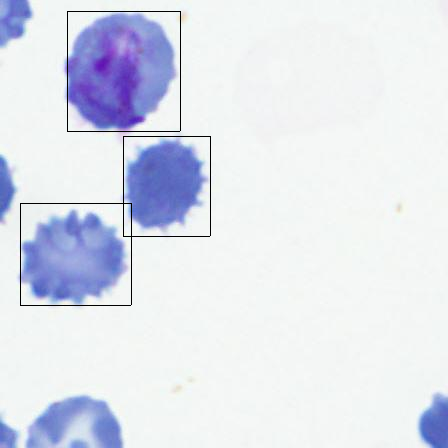

g8_t1_up/g6010021_232
g8_t1_up/g6010021_232.txt
['143', '288', '251', '373', 'rbc', 'False']
['52', '177', '147', '274', 'rbc', 'False']
['195', '90', '295', '194', 'rbc', 'False']
['274', '208', '396', '324', 'rbc', 'False']
['144', '173', '265', '284', 'tro', 'False']
['87', '353', '177', '440', 'rbc', 'False']


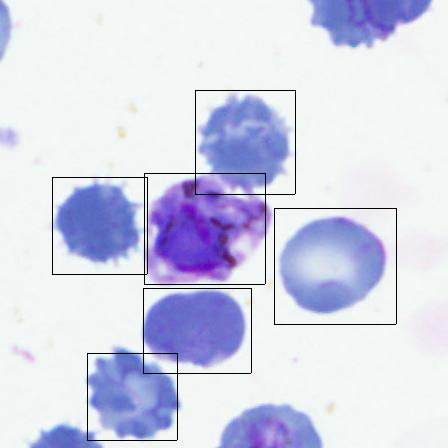

g8_t1_up/g6010021_239
g8_t1_up/g6010021_239.txt
['92', '240', '179', '340', 'rbc', 'False']
['36', '115', '149', '235', 'tro', 'False']


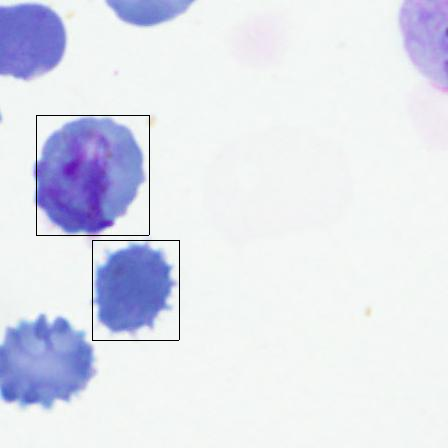

g8_t1_up/g6010021_248
g8_t1_up/g6010021_248.txt
['192', '286', '323', '400', 'tro', 'False']
['331', '308', '428', '405', 'rbc', 'False']


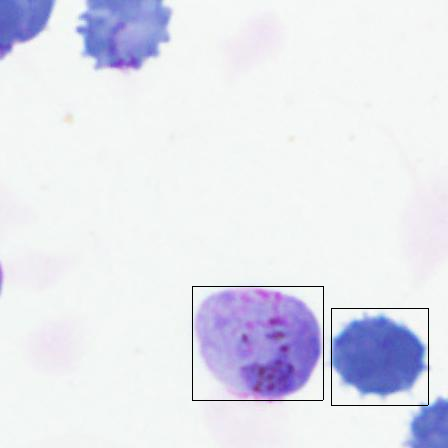

g8_t1_up/g6010021_255
g8_t1_up/g6010021_255.txt
['30', '317', '124', '420', 'rbc', 'False']
['303', '186', '390', '286', 'rbc', 'False']
['247', '61', '360', '181', 'tro', 'False']
['200', '253', '311', '355', 'rbc', 'False']
['53', '78', '147', '169', 'rbc', 'False']
['119', '12', '209', '99', 'rbc', 'False']
['111', '187', '196', '287', 'rbc', 'False']
['82', '289', '169', '367', 'rbc', 'False']
['58', '228', '155', '318', 'rbc', 'False']


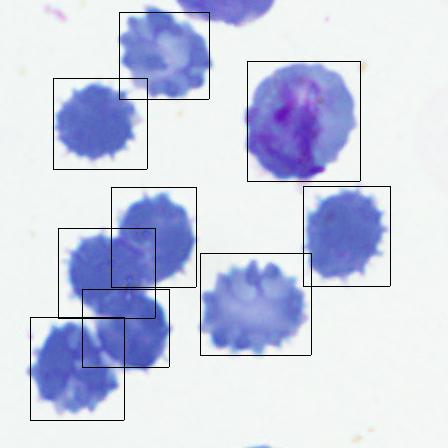

g8_t1_up/g6010021_259
g8_t1_up/g6010021_259.txt
['167', '275', '298', '389', 'tro', 'False']
['306', '297', '403', '394', 'rbc', 'False']


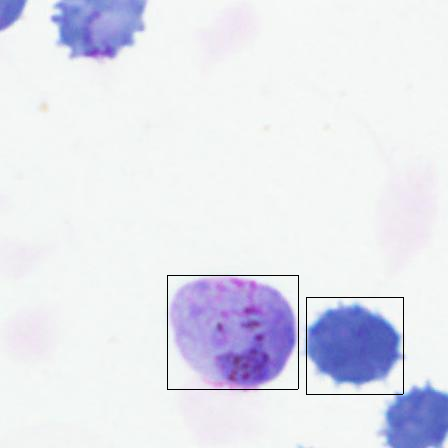

g8_t1_up/g6010021_269
g8_t1_up/g6010021_269.txt
['264', '134', '351', '234', 'rbc', 'False']
['208', '9', '321', '129', 'tro', 'False']
['161', '201', '272', '303', 'rbc', 'False']
['14', '26', '108', '117', 'rbc', 'False']
['72', '135', '157', '235', 'rbc', 'False']
['43', '237', '130', '315', 'rbc', 'False']
['19', '176', '116', '266', 'rbc', 'False']


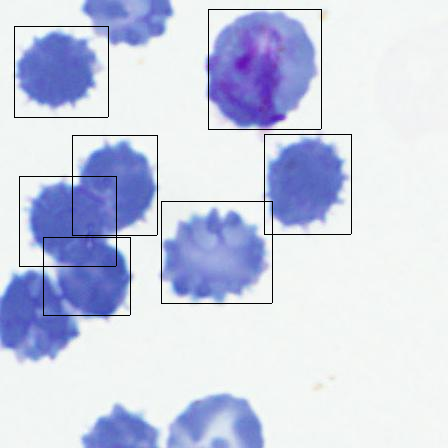

g8_t1_up/g6010021_270
g8_t1_up/g6010021_270.txt
['61', '107', '192', '221', 'tro', 'False']
['200', '129', '297', '226', 'rbc', 'False']
['167', '274', '254', '368', 'rbc', 'False']
['269', '212', '361', '299', 'rbc', 'False']


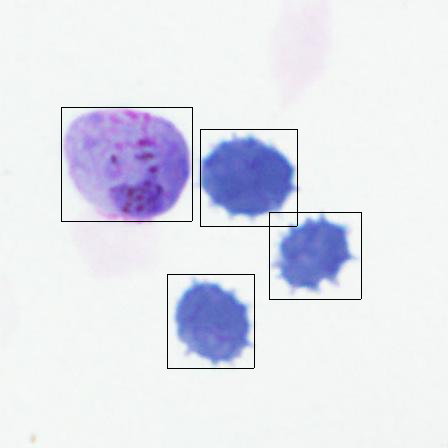

g8_t1_up/g6010021_275
g8_t1_up/g6010021_275.txt
['79', '87', '210', '201', 'tro', 'False']
['218', '109', '315', '206', 'rbc', 'False']
['185', '254', '272', '348', 'rbc', 'False']
['287', '192', '379', '279', 'rbc', 'False']


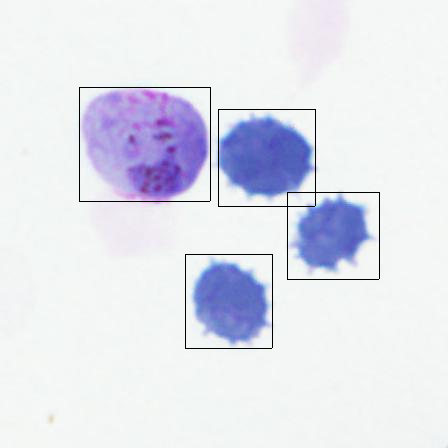

g8_t1_up/g6010021_279
g8_t1_up/g6010021_279.txt
['7', '270', '120', '390', 'tro', 'False']
['66', '76', '188', '192', 'rbc', 'False']


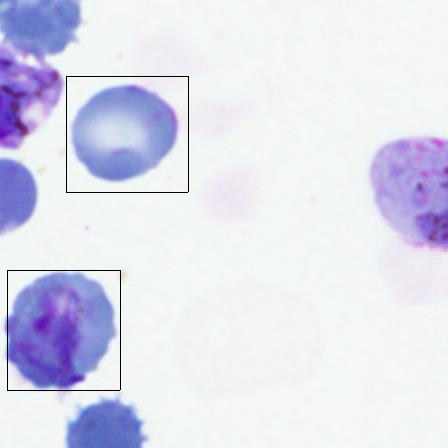

g8_t1_up/g6010021_281
g8_t1_up/g6010021_281.txt
['147', '187', '278', '301', 'tro', 'False']
['286', '209', '383', '306', 'rbc', 'False']
['355', '292', '447', '379', 'rbc', 'False']


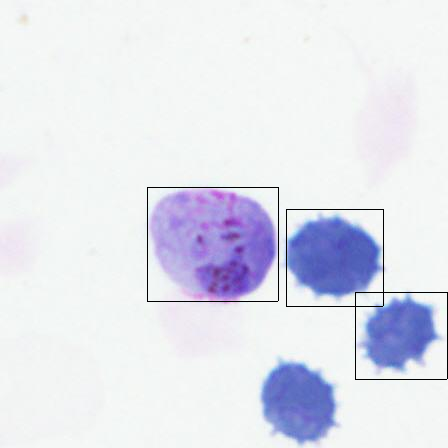

g8_t1_up/g6010021_283
g8_t1_up/g6010021_283.txt
['145', '53', '276', '167', 'tro', 'False']
['284', '75', '381', '172', 'rbc', 'False']
['251', '220', '338', '314', 'rbc', 'False']
['353', '158', '445', '245', 'rbc', 'False']


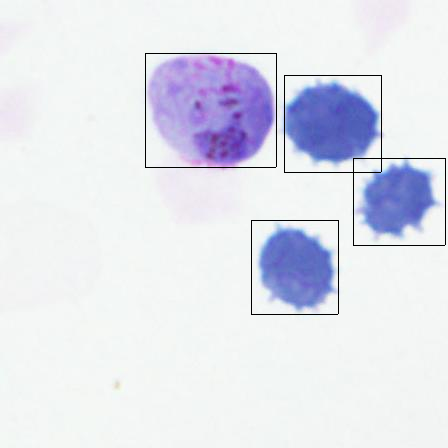

g8_t1_up/g6010021_284
g8_t1_up/g6010021_284.txt
['159', '125', '290', '239', 'tro', 'False']
['298', '147', '395', '244', 'rbc', 'False']
['265', '292', '352', '386', 'rbc', 'False']


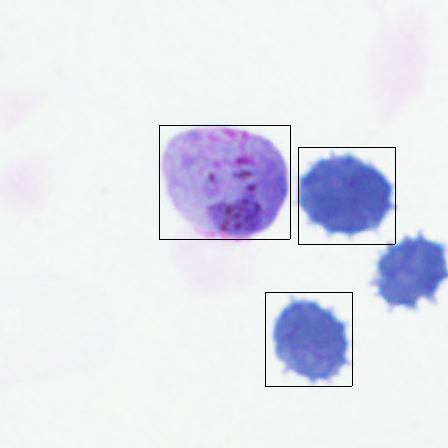

g8_t1_up/g6010021_301
g8_t1_up/g6010021_301.txt
['300', '120', '431', '234', 'tro', 'False']


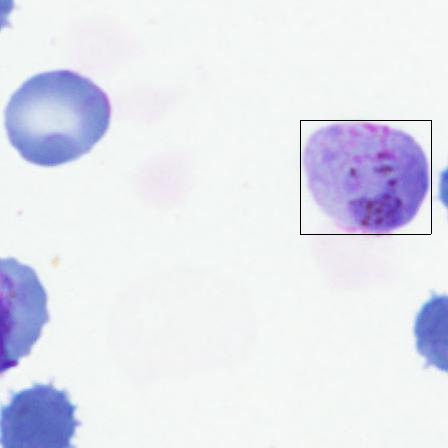

g8_t1_up/g6010021_305
g8_t1_up/g6010021_305.txt
['184', '72', '315', '186', 'tro', 'False']
['323', '94', '420', '191', 'rbc', 'False']
['290', '239', '377', '333', 'rbc', 'False']


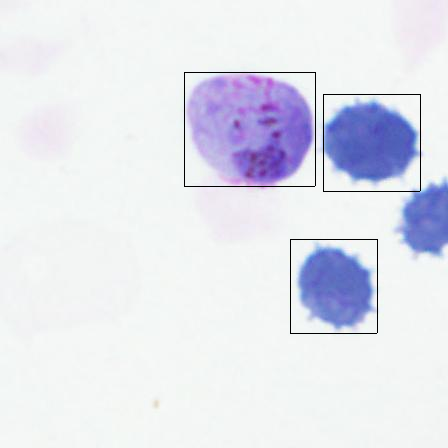

g8_t1_up/g6010021_306
g8_t1_up/g6010021_306.txt
['112', '75', '243', '189', 'tro', 'False']
['251', '97', '348', '194', 'rbc', 'False']
['218', '242', '305', '336', 'rbc', 'False']
['320', '180', '412', '267', 'rbc', 'False']


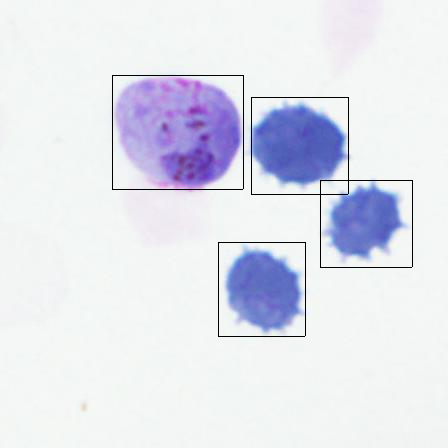

g8_t1_up/g6010021_307
g8_t1_up/g6010021_307.txt
['42', '78', '173', '192', 'tro', 'False']
['181', '100', '278', '197', 'rbc', 'False']
['148', '245', '235', '339', 'rbc', 'False']
['250', '183', '342', '270', 'rbc', 'False']


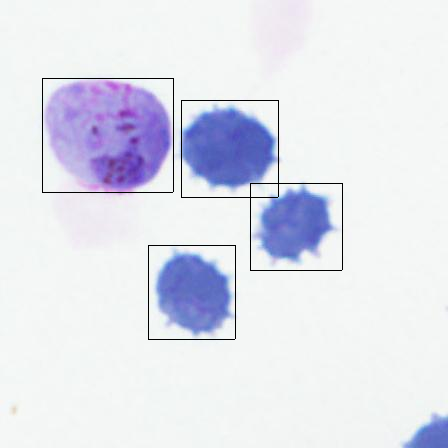

g8_t1_up/g6010021_308
g8_t1_up/g6010021_308.txt
['201', '92', '332', '206', 'tro', 'False']
['340', '114', '437', '211', 'rbc', 'False']
['307', '259', '394', '353', 'rbc', 'False']


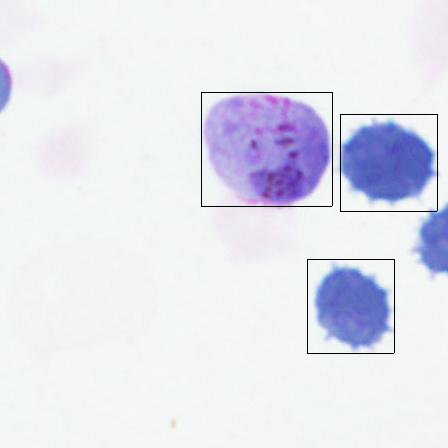

g8_t1_up/g6010021_313
g8_t1_up/g6010021_313.txt
['137', '291', '245', '376', 'rbc', 'False']
['46', '180', '141', '277', 'rbc', 'False']
['189', '93', '289', '197', 'rbc', 'False']
['268', '211', '390', '327', 'rbc', 'False']
['138', '176', '259', '287', 'tro', 'False']
['81', '356', '171', '443', 'rbc', 'False']


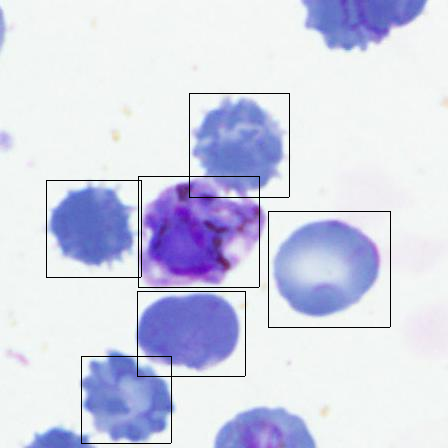

g8_t1_up/g6010021_321
g8_t1_up/g6010021_321.txt
['144', '40', '252', '125', 'rbc', 'False']
['272', '279', '359', '379', 'rbc', 'False']
['216', '154', '329', '274', 'tro', 'False']
['22', '171', '116', '262', 'rbc', 'False']
['88', '105', '178', '192', 'rbc', 'False']
['80', '280', '165', '380', 'rbc', 'False']
['27', '321', '124', '411', 'rbc', 'False']


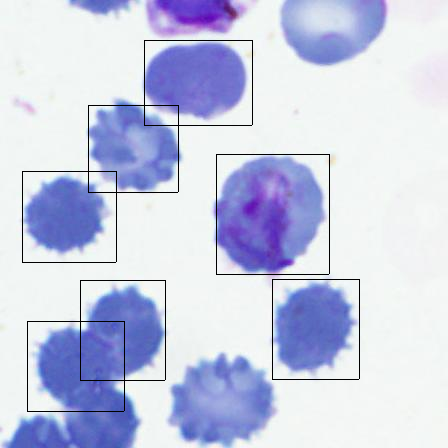

g8_t1_up/g6010021_328
g8_t1_up/g6010021_328.txt
['202', '170', '289', '270', 'rbc', 'False']
['146', '45', '259', '165', 'tro', 'False']
['99', '237', '210', '339', 'rbc', 'False']
['10', '171', '95', '271', 'rbc', 'False']


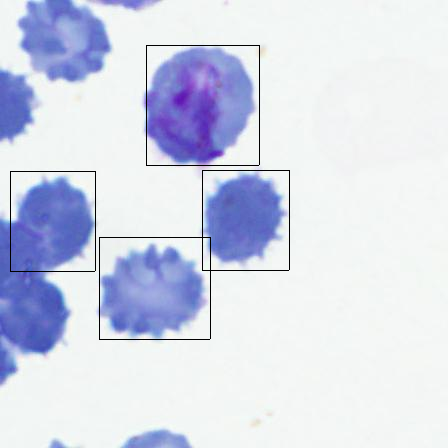

g8_t1_up/g6010021_330
g8_t1_up/g6010021_330.txt
['23', '19', '154', '133', 'tro', 'False']
['162', '41', '259', '138', 'rbc', 'False']
['129', '186', '216', '280', 'rbc', 'False']
['231', '124', '323', '211', 'rbc', 'False']


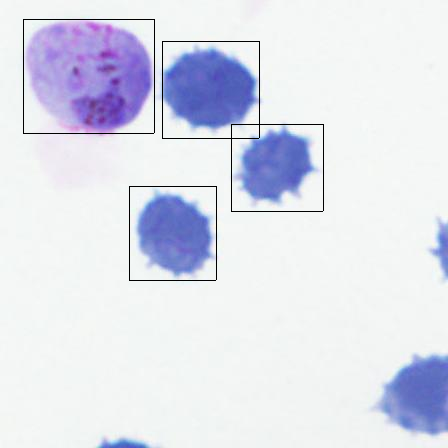

g8_t1_up/g6010021_333
g8_t1_up/g6010021_333.txt
['52', '47', '183', '161', 'tro', 'False']
['191', '69', '288', '166', 'rbc', 'False']
['158', '214', '245', '308', 'rbc', 'False']
['260', '152', '352', '239', 'rbc', 'False']


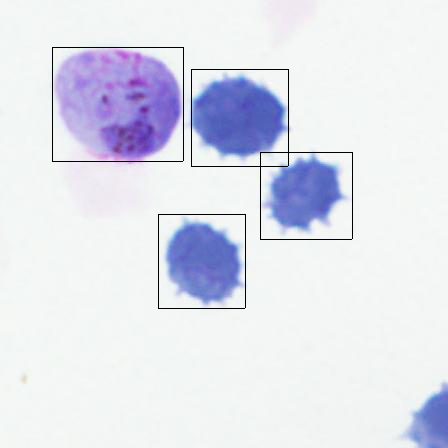

g8_t1_up/g6010021_336
g8_t1_up/g6010021_336.txt
['4', '200', '112', '285', 'rbc', 'False']
['76', '314', '189', '434', 'tro', 'False']
['56', '2', '156', '106', 'rbc', 'False']
['135', '120', '257', '236', 'rbc', 'False']
['5', '85', '126', '196', 'tro', 'False']


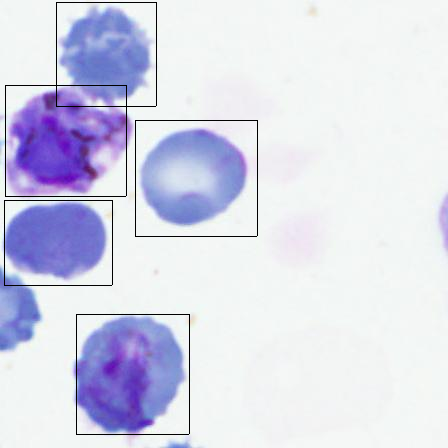

g8_t1_up/g6010021_341
g8_t1_up/g6010021_341.txt
['235', '280', '366', '394', 'tro', 'False']


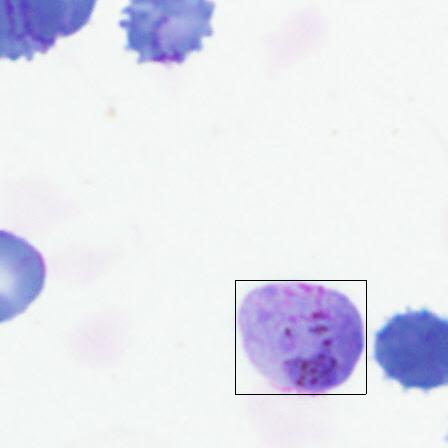

g8_t1_up/g6010021_344
g8_t1_up/g6010021_344.txt
['45', '249', '153', '334', 'rbc', 'False']
['97', '51', '197', '155', 'rbc', 'False']
['176', '169', '298', '285', 'rbc', 'False']
['46', '134', '167', '245', 'tro', 'False']


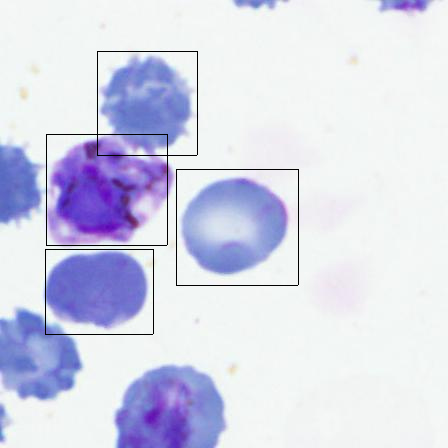

g8_t1_up/g6010021_352
g8_t1_up/g6010021_352.txt
['96', '314', '204', '399', 'rbc', 'False']
['5', '203', '100', '300', 'rbc', 'False']
['148', '116', '248', '220', 'rbc', 'False']
['227', '234', '349', '350', 'rbc', 'False']
['97', '199', '218', '310', 'tro', 'False']


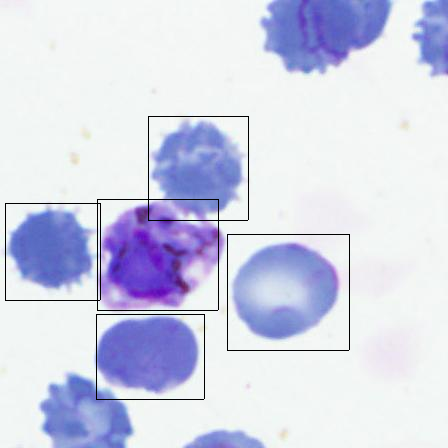

g8_t1_up/g6010021_357
g8_t1_up/g6010021_357.txt
['150', '293', '258', '378', 'rbc', 'False']
['59', '182', '154', '279', 'rbc', 'False']
['202', '95', '302', '199', 'rbc', 'False']
['281', '213', '403', '329', 'rbc', 'False']
['151', '178', '272', '289', 'tro', 'False']
['94', '358', '184', '445', 'rbc', 'False']


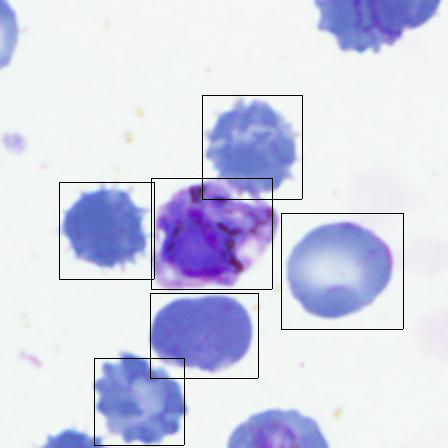

g8_t1_up/g6010021_359
g8_t1_up/g6010021_359.txt
['12', '155', '143', '269', 'tro', 'False']
['151', '177', '248', '274', 'rbc', 'False']
['118', '322', '205', '416', 'rbc', 'False']
['220', '260', '312', '347', 'rbc', 'False']


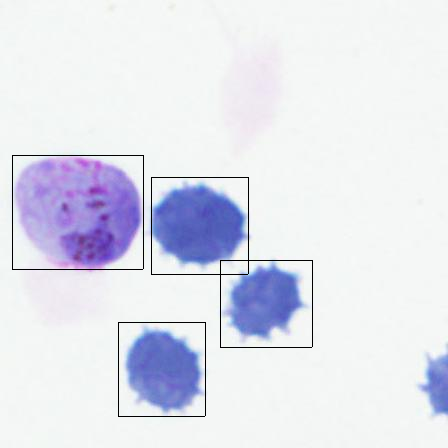

g8_t1_up/g6010021_360
g8_t1_up/g6010021_360.txt
['105', '289', '236', '403', 'tro', 'False']
['244', '311', '341', '408', 'rbc', 'False']


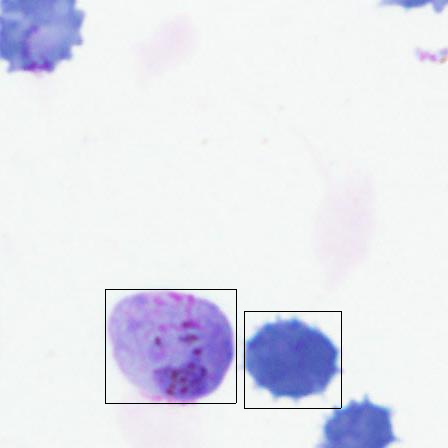

g8_t1_up/g6010021_374
g8_t1_up/g6010021_374.txt
['80', '256', '188', '341', 'rbc', 'False']
['132', '58', '232', '162', 'rbc', 'False']
['211', '176', '333', '292', 'rbc', 'False']
['81', '141', '202', '252', 'tro', 'False']
['24', '321', '114', '408', 'rbc', 'False']


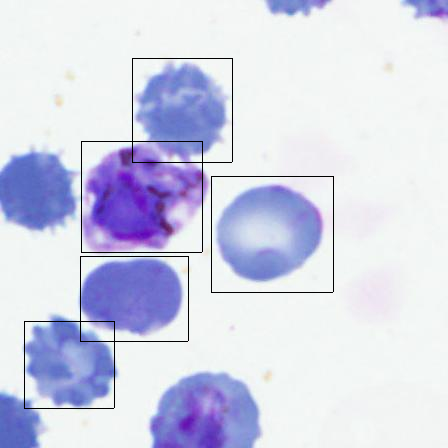

g8_t1_up/g6010021_381
g8_t1_up/g6010021_381.txt
['88', '169', '196', '254', 'rbc', 'False']
['160', '283', '273', '403', 'tro', 'False']
['219', '89', '341', '205', 'rbc', 'False']
['89', '54', '210', '165', 'tro', 'False']
['32', '234', '122', '321', 'rbc', 'False']


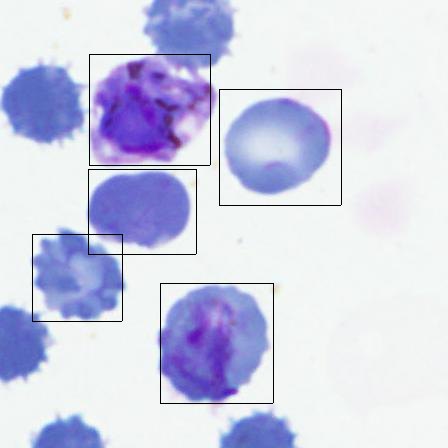

g8_t1_up/g6010021_382
g8_t1_up/g6010021_382.txt
['20', '216', '151', '330', 'tro', 'False']
['159', '238', '256', '335', 'rbc', 'False']
['228', '321', '320', '408', 'rbc', 'False']


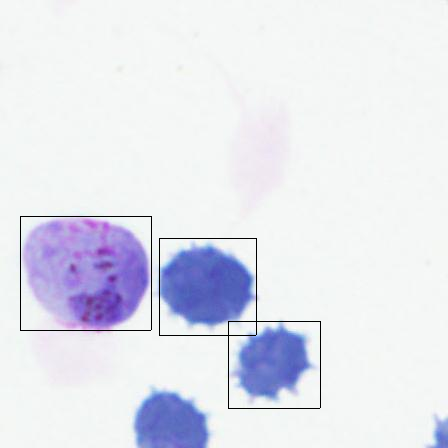

g8_t1_up/g6010021_388
g8_t1_up/g6010021_388.txt
['186', '139', '273', '239', 'rbc', 'False']
['130', '14', '243', '134', 'tro', 'False']
['83', '206', '194', '308', 'rbc', 'False']


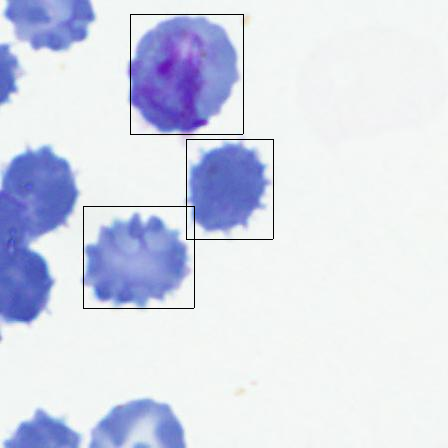

g8_t1_up/g6010021_389
g8_t1_up/g6010021_389.txt
['179', '251', '310', '365', 'tro', 'False']
['318', '273', '415', '370', 'rbc', 'False']


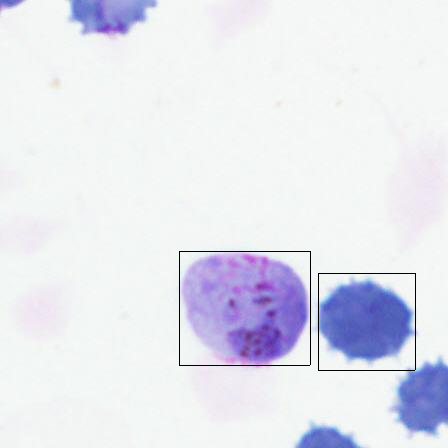

g8_t1_up/g6010021_392
g8_t1_up/g6010021_392.txt
['27', '174', '158', '288', 'tro', 'False']
['166', '196', '263', '293', 'rbc', 'False']
['133', '341', '220', '435', 'rbc', 'False']
['235', '279', '327', '366', 'rbc', 'False']


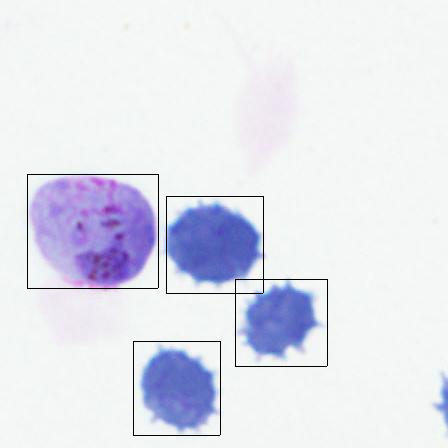

g8_t1_up/g6010021_393
g8_t1_up/g6010021_393.txt
['266', '23', '397', '137', 'tro', 'False']


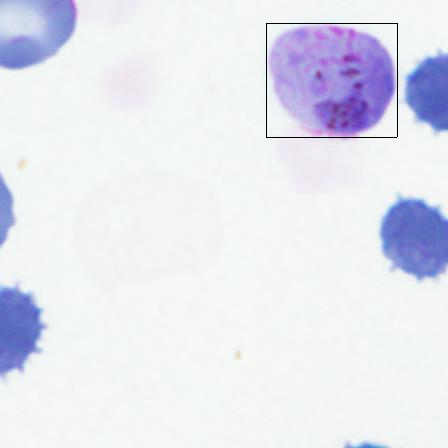

g8_t1_up/g6010021_400
g8_t1_up/g6010021_400.txt
['5', '130', '113', '215', 'rbc', 'False']
['77', '244', '190', '364', 'tro', 'False']
['136', '50', '258', '166', 'rbc', 'False']
['6', '15', '127', '126', 'tro', 'False']


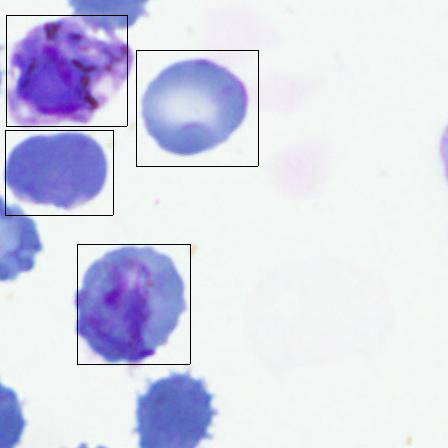

g8_t1_up/g6010105_1
g8_t1_up/g6010105_1.txt
['41', '262', '160', '378', 'rbc', 'False']
['41', '57', '138', '186', 'rbc', 'False']
['234', '9', '334', '125', 'rbc', 'False']


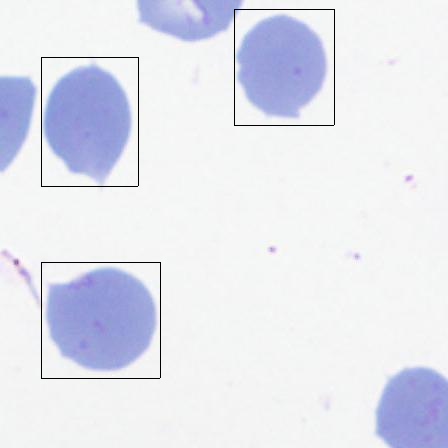

g8_t1_up/g6010105_2
g8_t1_up/g6010105_2.txt
['80', '3', '173', '113', 'rbc', 'False']
['269', '82', '372', '182', 'rbc', 'False']
['82', '263', '182', '379', 'rbc', 'False']


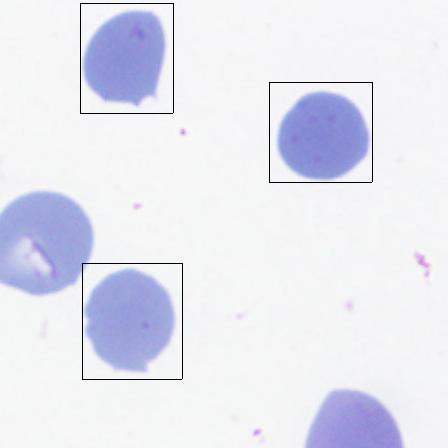

g8_t1_up/g6010105_3
g8_t1_up/g6010105_3.txt
['301', '106', '395', '221', 'rbc', 'False']
['196', '147', '305', '258', 'rbc', 'False']


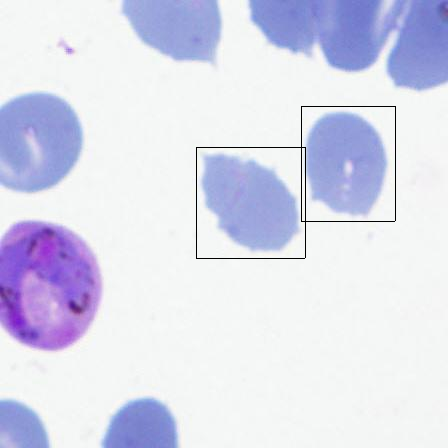

g8_t1_up/g6010105_4
g8_t1_up/g6010105_4.txt
['136', '155', '237', '267', 'rbc', 'False']
['248', '296', '352', '427', 'rbc', 'False']
['307', '66', '428', '195', 'rbc', 'False']


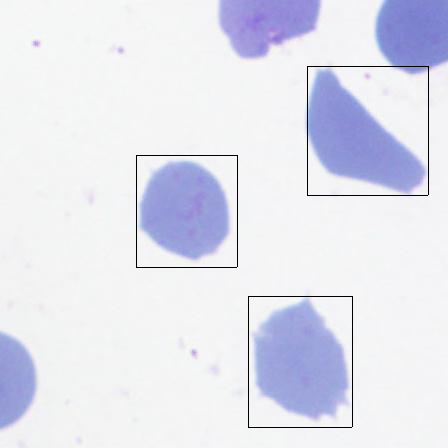

g8_t1_up/g6010105_5
g8_t1_up/g6010105_5.txt
['241', '29', '350', '149', 'rbc', 'False']
['21', '72', '128', '173', 'rbc', 'False']
['186', '163', '313', '289', 'tro', 'False']
['110', '221', '221', '350', 'rbc', 'False']
['127', '59', '222', '157', 'rbc', 'False']
['31', '275', '123', '366', 'rbc', 'False']


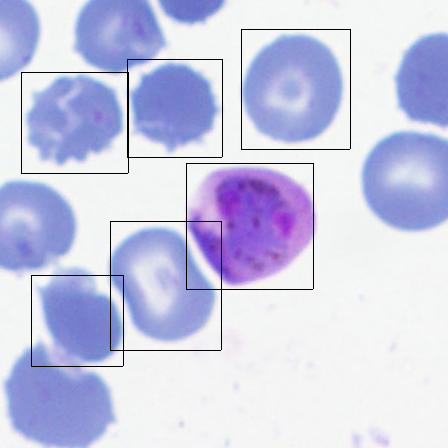

g8_t1_up/g6010105_6
g8_t1_up/g6010105_6.txt
['22', '187', '133', '287', 'rbc', 'False']
['202', '332', '309', '441', 'rbc', 'False']
['337', '198', '445', '312', 'rbc', 'False']
['101', '288', '198', '418', 'rbc', 'False']


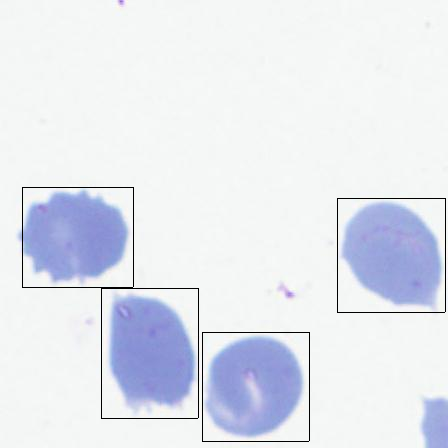

g8_t1_up/g6010105_7
g8_t1_up/g6010105_7.txt
['320', '48', '427', '157', 'rbc', 'False']
['118', '301', '218', '404', 'rbc', 'False']
['325', '176', '444', '315', 'tro', 'False']
['219', '4', '316', '134', 'rbc', 'False']
['193', '266', '281', '359', 'rbc', 'False']


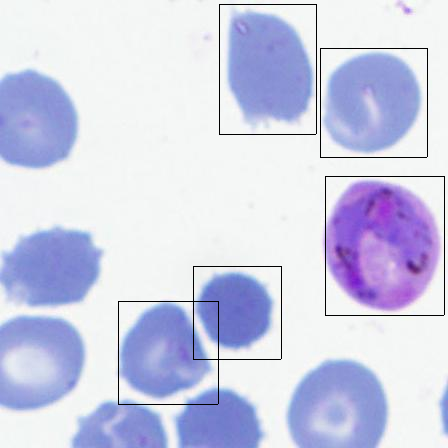

In [1]:
#check crops
import numpy as np
from PIL import Image
from IPython.display import display
import pickle
import os

#obtain list of test images in order
train_files = []
data_path = '/home/ubuntu/try1/'
with open(os.path.join(data_path,'data','ImageSets', 'train.txt')) as f:
    for file_ in f.readlines():
        train_files.append(file_.strip())
#print test_files

image_path = os.path.join(data_path,'data','Images')
classes = ['__background__', 'rbc', 'tro', 'sch', 'ring', 'gam', 'leu']
path = os.path.join(data_path,'data', 'Annotations')

#for each test image, for each class get the bounding box coordinates of the objects with probability >= THRESHOLD
#for each filtered detection, draw a colored box 
for file_index, file_ in enumerate(train_files):
    if file_index < 200 and file_index > 100:
        print file_
        #get numpy array of image 
        extension='.jpg'
        pil_im = np.asarray(Image.open(os.path.join(image_path, file_+extension)))

        pil_im = pil_im.copy()


        filtered_boxes=[]
        #open annotation file 
        filename = file_+'.txt'
        print filename
        with open(os.path.join(path, filename), 'r') as f:
            for line in f.readlines():
                line_list = line.split()
                print line_list
                filtered_boxes.append([float(i) for i in line_list[:-2]])

        for box in filtered_boxes:
            box = [int(box[ii]) for ii in range(len(box))]
            for i in range(box[0], box[2]):
                pil_im[box[1],i, :] = 0
                pil_im[box[3],i, :] = 0
            for j in range(box[1], box[3]):
                pil_im[j,box[0], :] = 0
                pil_im[j,box[2], :] = 0

        display(Image.fromarray(pil_im,'RGB'))